In [2]:
suppressMessages(library(ArchR))
library(parallel)
ss <- function(x, pattern, slot = 1, ...) { sapply(strsplit(x = x, split = pattern, ...), '[', slot) }
options(stringsAsFactors = F)
options(repr.plot.width=11, repr.plot.height=8.5)

In [3]:
sessionInfo()

R version 4.0.5 (2021-03-31)
Platform: x86_64-conda-linux-gnu (64-bit)
Running under: CentOS Linux 7 (Core)

Matrix products: default
BLAS/LAPACK: /home/mfranusi/miniconda3/envs/r4/lib/libopenblasp-r0.3.18.so

locale:
 [1] LC_CTYPE=en_US.UTF-8       LC_NUMERIC=C              
 [3] LC_TIME=en_US.UTF-8        LC_COLLATE=en_US.UTF-8    
 [5] LC_MONETARY=en_US.UTF-8    LC_MESSAGES=en_US.UTF-8   
 [7] LC_PAPER=en_US.UTF-8       LC_NAME=C                 
 [9] LC_ADDRESS=C               LC_TELEPHONE=C            
[11] LC_MEASUREMENT=en_US.UTF-8 LC_IDENTIFICATION=C       

attached base packages:
 [1] parallel  stats4    grid      stats     graphics  grDevices utils    
 [8] datasets  methods   base     

other attached packages:
 [1] rhdf5_2.34.0                SummarizedExperiment_1.20.0
 [3] Biobase_2.50.0              MatrixGenerics_1.2.1       
 [5] Rcpp_1.0.8.3                Matrix_1.4-0               
 [7] GenomicRanges_1.42.0        GenomeInfoDb_1.26.7        
 [9] IRanges_2.24.1    

In [7]:
##################################
### set Arrow File parameters ####
addArchRThreads(threads = round(parallel::detectCores()*3/4))

##################################
### load rheMac10 ArchR genome ###
GENOMEDIR='/home/bnphan/resources/genomes/rheMac10'
load(file.path(GENOMEDIR,'rheMac10_liftoff_GRCh38.p13_ArchR_annotations.rda'))

Setting default number of Parallel threads to 48.



In [8]:
PROJDIR='../../../data/tidy_data/ArchRProjects'
ARCHDIR=file.path(PROJDIR,'Macaque_DorsalHorn_scATAC')
proj = loadArchRProject(ARCHDIR)

Successfully loaded ArchRProject!


                                                   / |
                                                 /    \
            .                                  /      |.
            \\\                              /        |.
              \\\                          /           `|.
                \\\                      /              |.
                  \                    /                |\
                  \\#####\           /                  ||
                ==###########>      /                   ||
                 \\##==......\    /                     ||
            ______ =       =|__ /__                     ||      \\\
        ,--' ,----`-,__ ___/'  --,-`-===================##========>
       \               '        ##_______ _____ ,--,__,=##,__   ///
        ,    __==    ___,-,__,--'#'  ==='      `-'    | ##,-/
        -,____,---'       \\####\\________________,--\\_##,/
           ___      .______        ______  __    __  .____

# Make plots

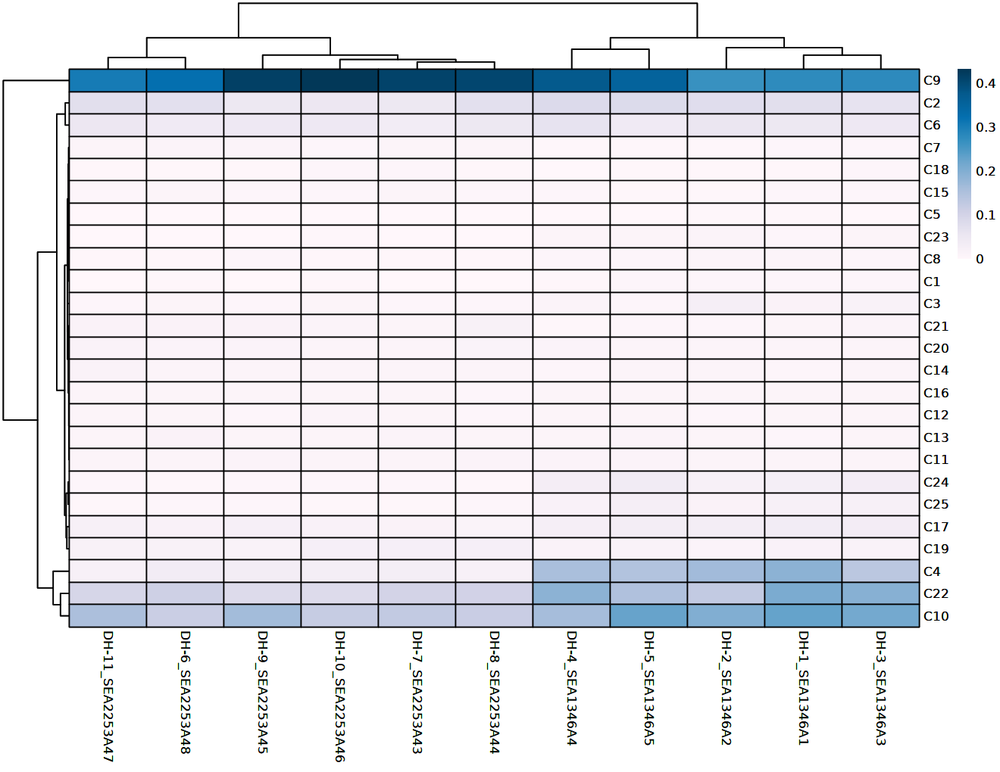

In [22]:
# plot the confusion matrix of cell types by subjects
cM <- confusionMatrix(paste0(proj$ClustersH200_ATAC), paste0(proj$Sample))
cM <- cM / Matrix::colSums(cM)
p <- pheatmap::pheatmap(
  mat = as.matrix(cM), 
  color = paletteContinuous("whiteBlue"), 
  border_color = "black")
p

In [13]:
head(getCellColData(proj))

DataFrame with 6 rows and 22 columns
                                        Sample TSSEnrichment ReadsInTSS
                                   <character>     <numeric>  <numeric>
DH-1_SEA1346A1#CAAACCTGATACTTTC DH-1_SEA1346A1        14.364       6572
DH-1_SEA1346A1#CGCGTTGGAGTGGTGA DH-1_SEA1346A1         9.010       3458
DH-1_SEA1346A1#CCTTCCAGAAGGACAC DH-1_SEA1346A1        17.720       8519
DH-1_SEA1346A1#TAGTTGCGACGGTACC DH-1_SEA1346A1        19.339       8555
DH-1_SEA1346A1#TAGTGCTGATAGGTTC DH-1_SEA1346A1        22.142      10712
DH-1_SEA1346A1#GTGGTAACTTCGCAGC DH-1_SEA1346A1        18.177       7876
                                ReadsInPromoter PromoterRatio    PassQC
                                      <numeric>     <numeric> <numeric>
DH-1_SEA1346A1#CAAACCTGATACTTTC           33398      0.169640         1
DH-1_SEA1346A1#CGCGTTGGAGTGGTGA           20955      0.110136         1
DH-1_SEA1346A1#CCTTCCAGAAGGACAC           39634      0.230613         1
DH-1_SEA1346A1#TAGTTGCGACGG

ArchR logging to : ArchRLogs/ArchR-plotEmbedding-2a7dc69f2a320-Date-2022-07-06_Time-14-12-05.log
If there is an issue, please report to github with logFile!

Getting UMAP Embedding

ColorBy = cellColData

Plotting Embedding

1 
Length of unique values greater than palette, interpolating..



ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-2a7dc69f2a320-Date-2022-07-06_Time-14-12-05.log

ArchR logging to : ArchRLogs/ArchR-plotEmbedding-2a7dc35a355c5-Date-2022-07-06_Time-14-12-11.log
If there is an issue, please report to github with logFile!

Getting UMAP Embedding

ColorBy = cellColData

Plotting Embedding

1 


ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-2a7dc35a355c5-Date-2022-07-06_Time-14-12-11.log



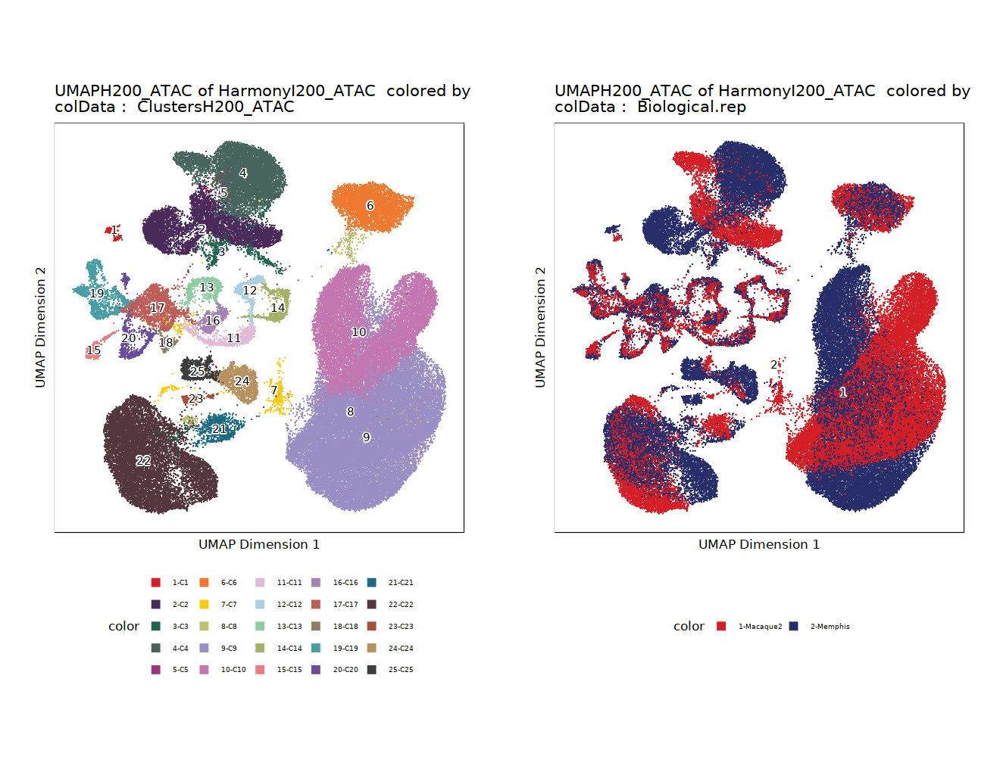

In [15]:
## make UMAP plots
p1 <- plotEmbedding(ArchRProj = proj, colorBy = "cellColData", 
                    name = "ClustersH200_ATAC", embedding = "UMAPH200_ATAC")

p3 <- plotEmbedding(ArchRProj = proj, colorBy = "cellColData", 
                    name = "Biological.rep", embedding = "UMAPH200_ATAC")
                    
ggAlignPlots(p1, p3, type = "h")

ArchR logging to : ArchRLogs/ArchR-plotEmbedding-65635694e612-Date-2022-07-05_Time-15-03-45.log
If there is an issue, please report to github with logFile!

Getting UMAP Embedding

ColorBy = cellColData

Plotting Embedding

1 
Length of unique values greater than palette, interpolating..



ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-65635694e612-Date-2022-07-05_Time-15-03-45.log

ArchR logging to : ArchRLogs/ArchR-plotEmbedding-65636da07ac4-Date-2022-07-05_Time-15-03-46.log
If there is an issue, please report to github with logFile!

Getting UMAP Embedding

ColorBy = cellColData

Plotting Embedding

1 


ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-65636da07ac4-Date-2022-07-05_Time-15-03-46.log

ArchR logging to : ArchRLogs/ArchR-plotEmbedding-65635a593b50-Date-2022-07-05_Time-15-03-54.log
If there is an issue, please report to github with logFile!

Getting UMAP Embedding

ColorBy = cellColData

Plotting Embedding

1 


ArchR logging successful to : Arch

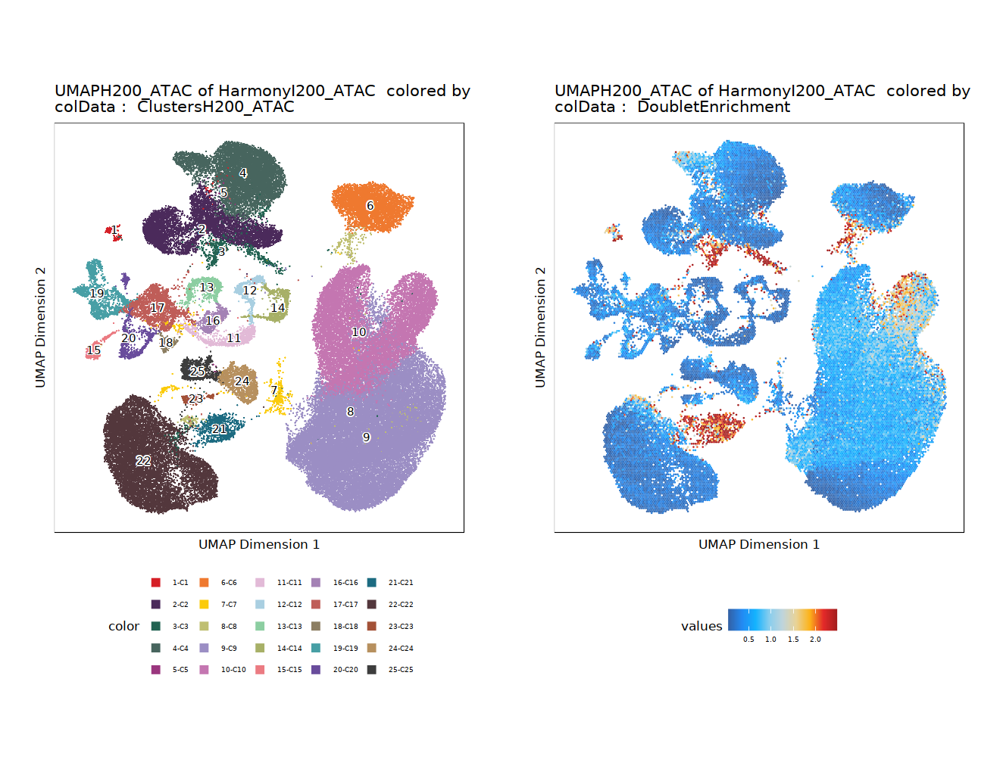

ArchR logging to : ArchRLogs/ArchR-plotEmbedding-65638b2f57-Date-2022-07-05_Time-15-04-03.log
If there is an issue, please report to github with logFile!

Getting UMAP Embedding

ColorBy = cellColData

Plotting Embedding

1 


ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-65638b2f57-Date-2022-07-05_Time-15-04-03.log



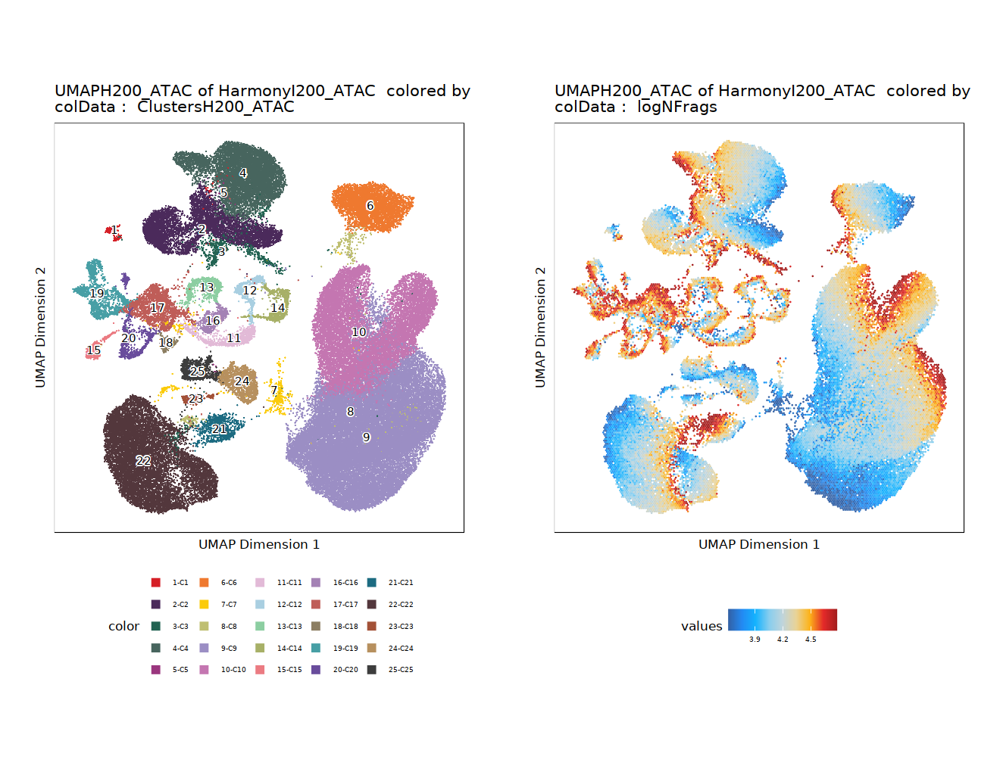

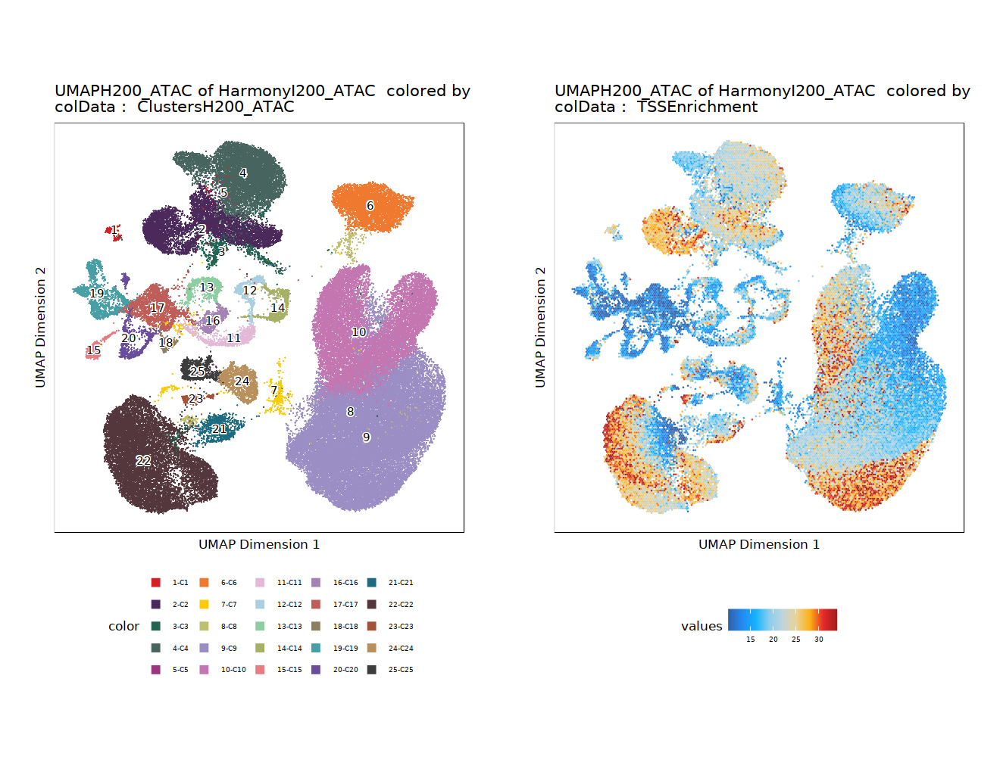

In [7]:
## make UMAP plots of
p1 <- plotEmbedding(ArchRProj = proj, colorBy = "cellColData", 
                    name = "ClustersH200_ATAC", embedding = "UMAPH230")

p2 <- plotEmbedding(ArchRProj = proj, colorBy = "cellColData", 
                    name = "DoubletEnrichment", embedding = "UMAPH230")

ggAlignPlots(p1, p2, type = "h")

proj$logNFrags = log10(proj$nFrags)

p3 <- plotEmbedding(ArchRProj = proj, colorBy = "cellColData", 
                    name = "logNFrags", embedding = "UMAPH200_ATAC")

ggAlignPlots(p1, p3, type = "h")

p4 <- plotEmbedding(ArchRProj = proj, colorBy = "cellColData", 
                    name = "TSSEnrichment", embedding = "UMAPH200_ATAC")

ggAlignPlots(p1, p4, type = "h")

Getting ImputeWeights

ArchR logging to : ArchRLogs/ArchR-plotEmbedding-2a7dc2864aff6-Date-2022-07-06_Time-16-26-10.log
If there is an issue, please report to github with logFile!

Getting UMAP Embedding

ColorBy = GeneScoreMatrix

Getting Matrix Values...

2022-07-06 16:26:23 : 



Imputing Matrix

Using weights on disk

Using weights on disk

Plotting Embedding

1 
2 
3 
4 


ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-2a7dc2864aff6-Date-2022-07-06_Time-16-26-10.log

Warning message:
“`guides(<scale> = FALSE)` is deprecated. Please use `guides(<scale> = "none")` instead.”
Warning message:
“`guides(<scale> = FALSE)` is deprecated. Please use `guides(<scale> = "none")` instead.”
Warning message:
“`guides(<scale> = FALSE)` is deprecated. Please use `guides(<scale> = "none")` instead.”
Warning message:
“`guides(<scale> = FALSE)` is deprecated. Please use `guides(<scale> = "none")` instead.”


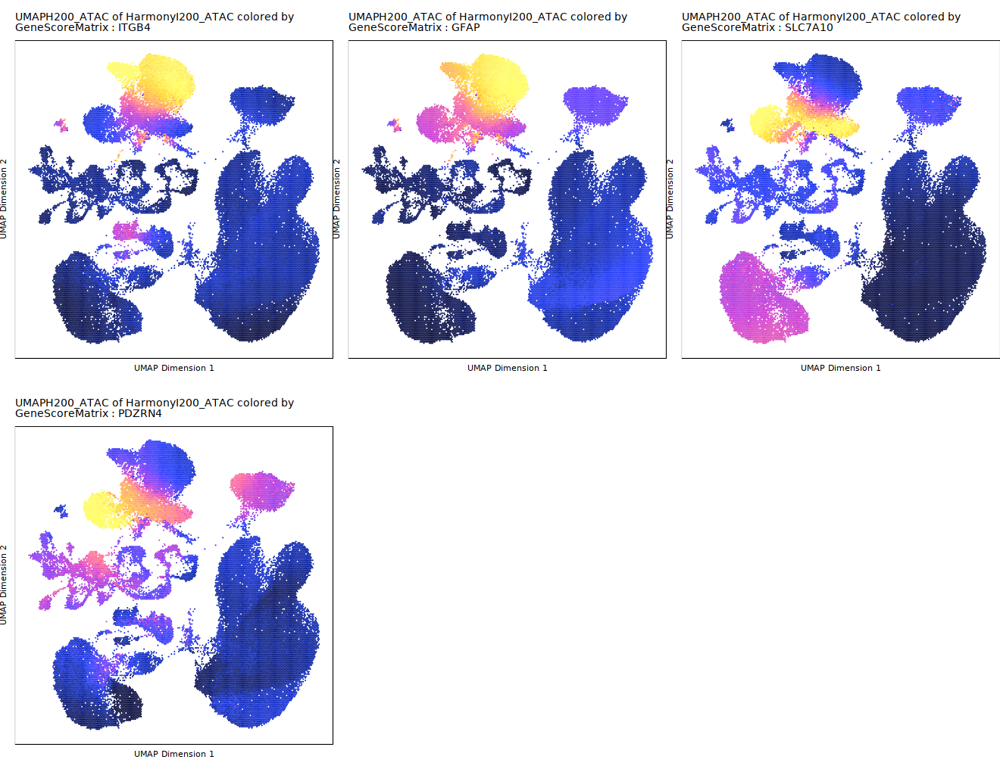

In [36]:
## Neuron vs. Glia markers
markerGenes1  <- c('ITGB4',#Astrocyte1
                   'GFAP',#Astrocyte1
                   'SLC7A10',#Astrocyte2
                   'PDZRN4'#Astrocyte2
                  )

p <- plotEmbedding( ArchRProj = proj, colorBy = "GeneScoreMatrix", 
                    name = markerGenes1, embedding = "UMAPH200_ATAC")
p <- lapply(p, function(x){
  x + guides(color = FALSE, fill = FALSE) + 
    theme_ArchR(baseSize = 6.5) + theme(plot.margin = unit(c(0, 0, 0, 0), "cm")) +
    theme(  axis.text.x=element_blank(),  axis.ticks.x=element_blank(), 
            axis.text.y=element_blank(),  axis.ticks.y=element_blank())
})
do.call(cowplot::plot_grid, c(list(ncol = 3),p))

Getting ImputeWeights

ArchR logging to : ArchRLogs/ArchR-plotEmbedding-2a7dc2c32efc9-Date-2022-07-06_Time-15-56-34.log
If there is an issue, please report to github with logFile!

Getting UMAP Embedding

ColorBy = GeneScoreMatrix

Getting Matrix Values...

2022-07-06 15:56:37 : 



Imputing Matrix

Using weights on disk

Using weights on disk

Plotting Embedding

1 
2 


ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-2a7dc2c32efc9-Date-2022-07-06_Time-15-56-34.log

Warning message:
“`guides(<scale> = FALSE)` is deprecated. Please use `guides(<scale> = "none")` instead.”
Warning message:
“`guides(<scale> = FALSE)` is deprecated. Please use `guides(<scale> = "none")` instead.”


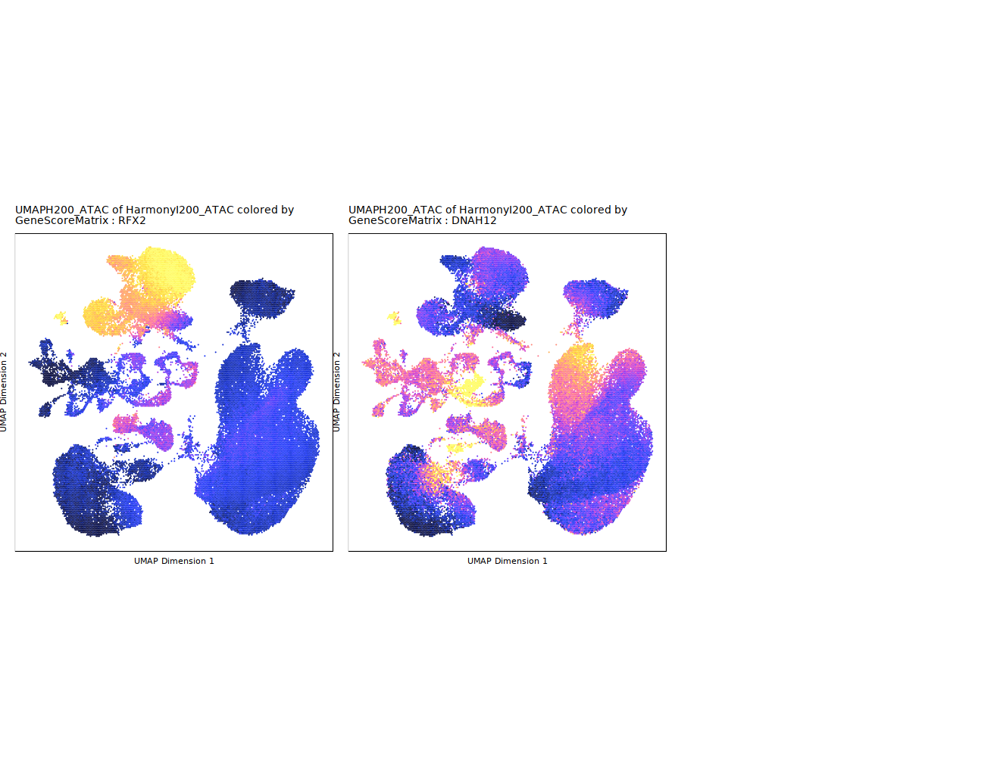

In [29]:
## Neuron vs. Glia markers
markerGenes1  <- c('RFX2',#Ependymal 
                   'DNAH12'#Ependymal 
                  )

p <- plotEmbedding( ArchRProj = proj, colorBy = "GeneScoreMatrix", 
                    name = markerGenes1, embedding = "UMAPH200_ATAC")
p <- lapply(p, function(x){
  x + guides(color = FALSE, fill = FALSE) + 
    theme_ArchR(baseSize = 6.5) + theme(plot.margin = unit(c(0, 0, 0, 0), "cm")) +
    theme(  axis.text.x=element_blank(),  axis.ticks.x=element_blank(), 
            axis.text.y=element_blank(),  axis.ticks.y=element_blank())
})
do.call(cowplot::plot_grid, c(list(ncol = 3),p))

Getting ImputeWeights

ArchR logging to : ArchRLogs/ArchR-plotEmbedding-2a7dc7a233d74-Date-2022-07-06_Time-15-59-03.log
If there is an issue, please report to github with logFile!

Getting UMAP Embedding

ColorBy = GeneScoreMatrix

Getting Matrix Values...

2022-07-06 15:59:03 : 



Imputing Matrix

Using weights on disk

Using weights on disk

Plotting Embedding

1 
2 


ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-2a7dc7a233d74-Date-2022-07-06_Time-15-59-03.log

Warning message:
“`guides(<scale> = FALSE)` is deprecated. Please use `guides(<scale> = "none")` instead.”
Warning message:
“`guides(<scale> = FALSE)` is deprecated. Please use `guides(<scale> = "none")` instead.”


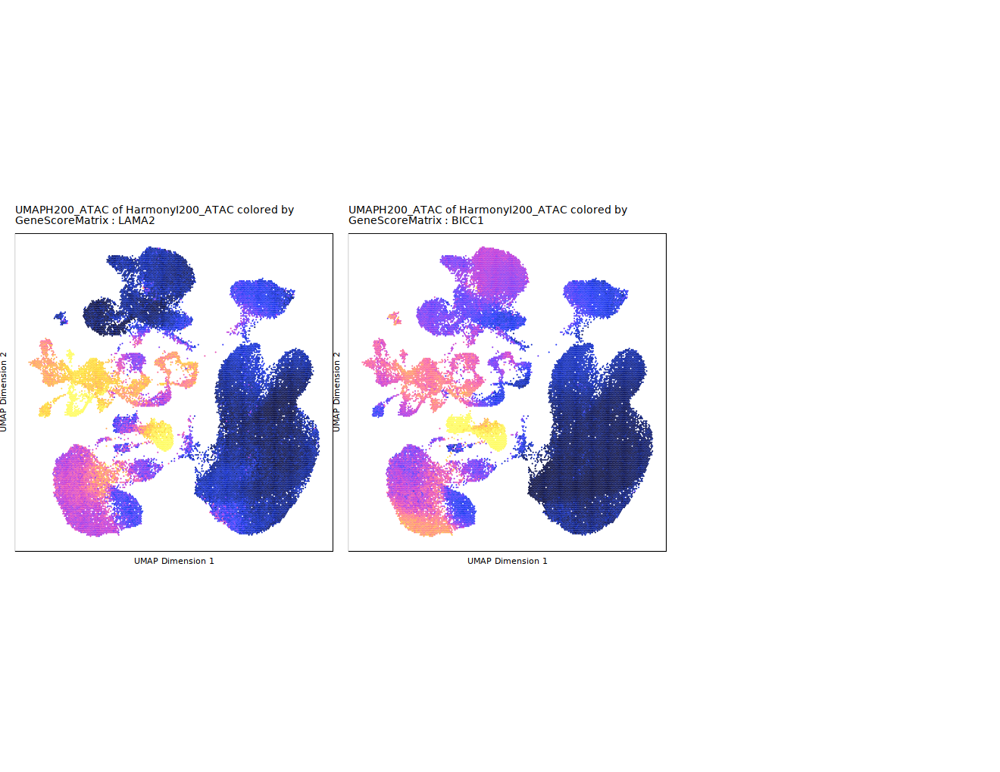

In [30]:
## Neuron vs. Glia markers
markerGenes1  <- c('LAMA2',#Meninges
                   'BICC1'#Meninges
                  )

p <- plotEmbedding( ArchRProj = proj, colorBy = "GeneScoreMatrix", 
                    name = markerGenes1, embedding = "UMAPH200_ATAC")
p <- lapply(p, function(x){
  x + guides(color = FALSE, fill = FALSE) + 
    theme_ArchR(baseSize = 6.5) + theme(plot.margin = unit(c(0, 0, 0, 0), "cm")) +
    theme(  axis.text.x=element_blank(),  axis.ticks.x=element_blank(), 
            axis.text.y=element_blank(),  axis.ticks.y=element_blank())
})
do.call(cowplot::plot_grid, c(list(ncol = 3),p))

Getting ImputeWeights

ArchR logging to : ArchRLogs/ArchR-plotEmbedding-2a7dc693e921b-Date-2022-07-06_Time-16-00-44.log
If there is an issue, please report to github with logFile!

Getting UMAP Embedding

ColorBy = GeneScoreMatrix

Getting Matrix Values...

2022-07-06 16:00:45 : 



Imputing Matrix

Using weights on disk

Using weights on disk

Plotting Embedding

1 
2 


ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-2a7dc693e921b-Date-2022-07-06_Time-16-00-44.log

Warning message:
“`guides(<scale> = FALSE)` is deprecated. Please use `guides(<scale> = "none")` instead.”
Warning message:
“`guides(<scale> = FALSE)` is deprecated. Please use `guides(<scale> = "none")` instead.”


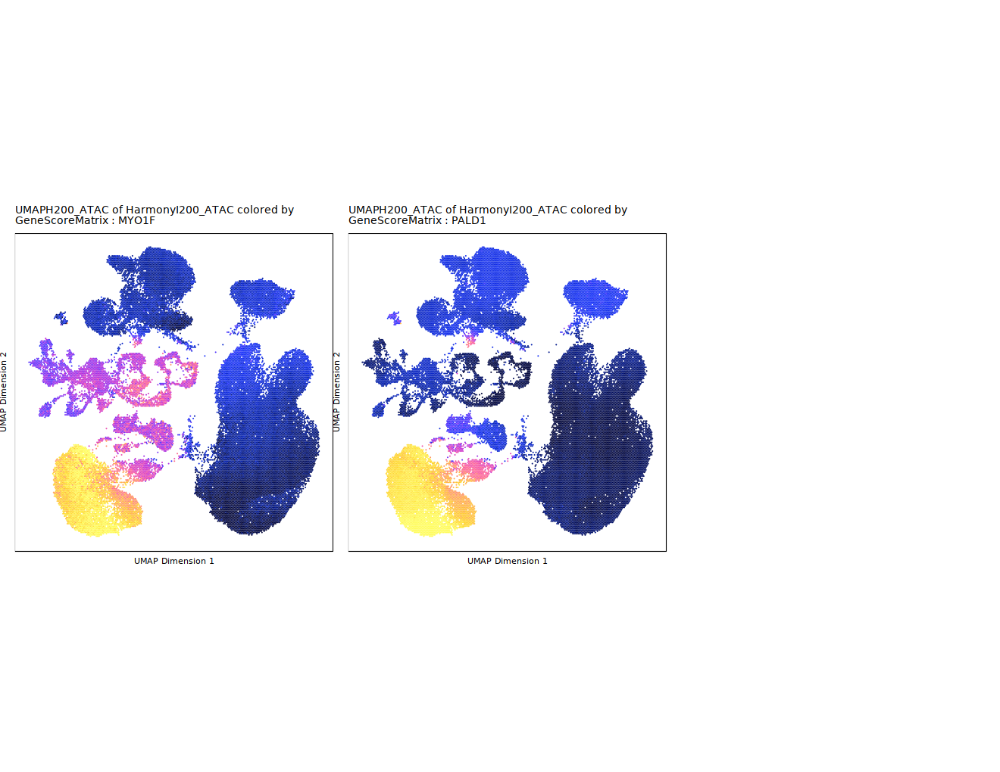

In [31]:
## Neuron vs. Glia markers
markerGenes1  <- c('MYO1F',#Microglia
                   'PALD1' #Microglia
                  )

p <- plotEmbedding( ArchRProj = proj, colorBy = "GeneScoreMatrix", 
                    name = markerGenes1, embedding = "UMAPH200_ATAC")
p <- lapply(p, function(x){
  x + guides(color = FALSE, fill = FALSE) + 
    theme_ArchR(baseSize = 6.5) + theme(plot.margin = unit(c(0, 0, 0, 0), "cm")) +
    theme(  axis.text.x=element_blank(),  axis.ticks.x=element_blank(), 
            axis.text.y=element_blank(),  axis.ticks.y=element_blank())
})
do.call(cowplot::plot_grid, c(list(ncol = 3),p))

Getting ImputeWeights

ArchR logging to : ArchRLogs/ArchR-plotEmbedding-2a7dc51b8f302-Date-2022-07-06_Time-16-02-32.log
If there is an issue, please report to github with logFile!

Getting UMAP Embedding

ColorBy = GeneScoreMatrix

Getting Matrix Values...

2022-07-06 16:02:33 : 



Imputing Matrix

Using weights on disk

Using weights on disk

Plotting Embedding

1 
2 
3 


ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-2a7dc51b8f302-Date-2022-07-06_Time-16-02-32.log

Warning message:
“`guides(<scale> = FALSE)` is deprecated. Please use `guides(<scale> = "none")` instead.”
Warning message:
“`guides(<scale> = FALSE)` is deprecated. Please use `guides(<scale> = "none")` instead.”
Warning message:
“`guides(<scale> = FALSE)` is deprecated. Please use `guides(<scale> = "none")` instead.”


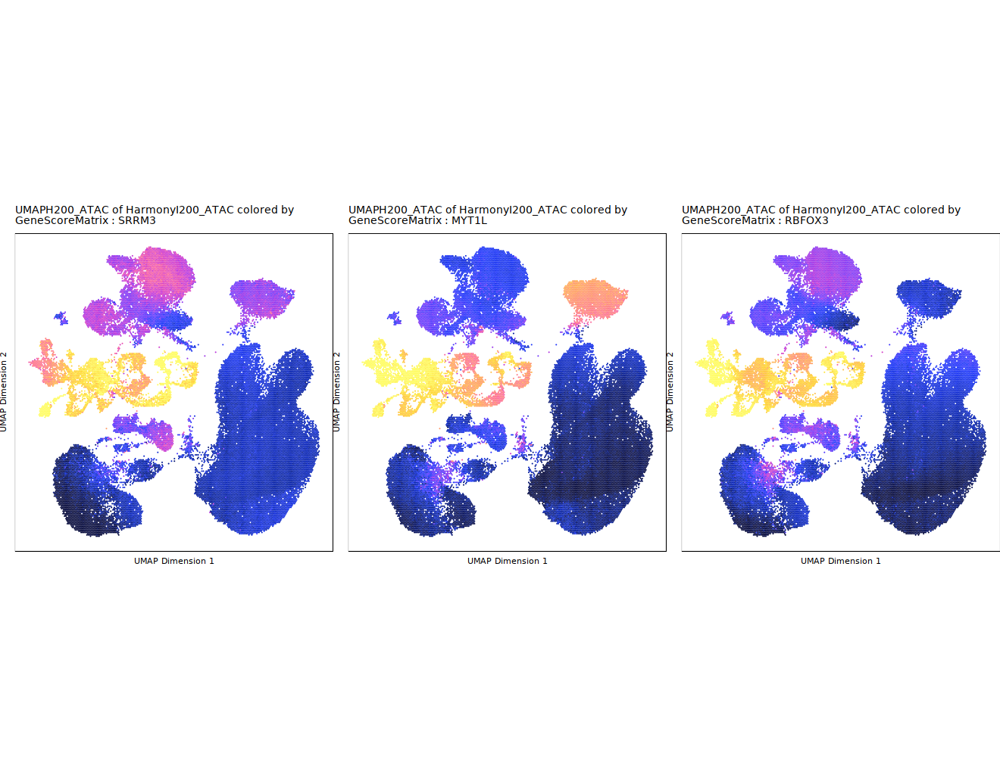

In [32]:
## Neuron vs. Glia markers
markerGenes1  <- c('SRRM3',#Neurons
                   'MYT1L',#Neurons
                   'RBFOX3'#Neurons
                  )

p <- plotEmbedding( ArchRProj = proj, colorBy = "GeneScoreMatrix", 
                    name = markerGenes1, embedding = "UMAPH200_ATAC")
p <- lapply(p, function(x){
  x + guides(color = FALSE, fill = FALSE) + 
    theme_ArchR(baseSize = 6.5) + theme(plot.margin = unit(c(0, 0, 0, 0), "cm")) +
    theme(  axis.text.x=element_blank(),  axis.ticks.x=element_blank(), 
            axis.text.y=element_blank(),  axis.ticks.y=element_blank())
})
do.call(cowplot::plot_grid, c(list(ncol = 3),p))

Getting ImputeWeights

ArchR logging to : ArchRLogs/ArchR-plotEmbedding-2a7dc66847b5b-Date-2022-07-06_Time-16-04-27.log
If there is an issue, please report to github with logFile!

Getting UMAP Embedding

ColorBy = GeneScoreMatrix

Getting Matrix Values...

2022-07-06 16:04:27 : 



Imputing Matrix

Using weights on disk

Using weights on disk

Plotting Embedding

1 
2 


ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-2a7dc66847b5b-Date-2022-07-06_Time-16-04-27.log

Warning message:
“`guides(<scale> = FALSE)` is deprecated. Please use `guides(<scale> = "none")` instead.”
Warning message:
“`guides(<scale> = FALSE)` is deprecated. Please use `guides(<scale> = "none")` instead.”


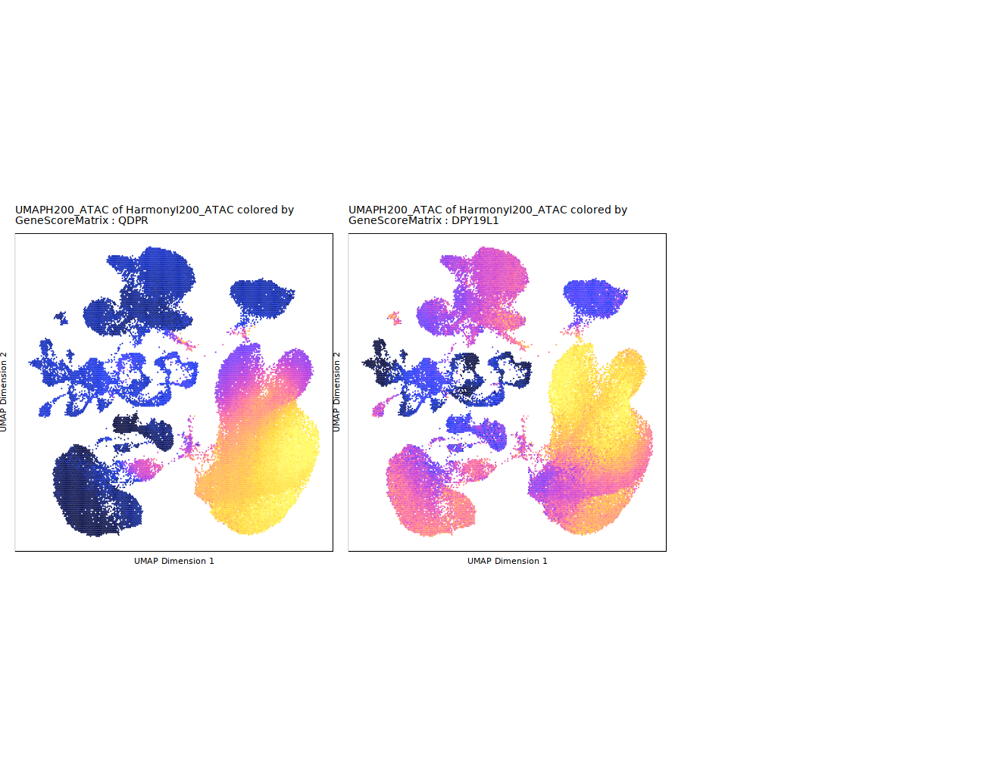

In [33]:
## Neuron vs. Glia markers
markerGenes1  <- c('QDPR',#Oligo1
                   'DPY19L1'#Oligo2
                  )

p <- plotEmbedding( ArchRProj = proj, colorBy = "GeneScoreMatrix", 
                    name = markerGenes1, embedding = "UMAPH200_ATAC")
p <- lapply(p, function(x){
  x + guides(color = FALSE, fill = FALSE) + 
    theme_ArchR(baseSize = 6.5) + theme(plot.margin = unit(c(0, 0, 0, 0), "cm")) +
    theme(  axis.text.x=element_blank(),  axis.ticks.x=element_blank(), 
            axis.text.y=element_blank(),  axis.ticks.y=element_blank())
})
do.call(cowplot::plot_grid, c(list(ncol = 3),p))

Getting ImputeWeights

ArchR logging to : ArchRLogs/ArchR-plotEmbedding-2a7dc2dba25c2-Date-2022-07-06_Time-16-06-16.log
If there is an issue, please report to github with logFile!

Getting UMAP Embedding

ColorBy = GeneScoreMatrix

Getting Matrix Values...

2022-07-06 16:06:16 : 



Imputing Matrix

Using weights on disk

Using weights on disk

Plotting Embedding

1 
2 


ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-2a7dc2dba25c2-Date-2022-07-06_Time-16-06-16.log

Warning message:
“`guides(<scale> = FALSE)` is deprecated. Please use `guides(<scale> = "none")` instead.”
Warning message:
“`guides(<scale> = FALSE)` is deprecated. Please use `guides(<scale> = "none")` instead.”


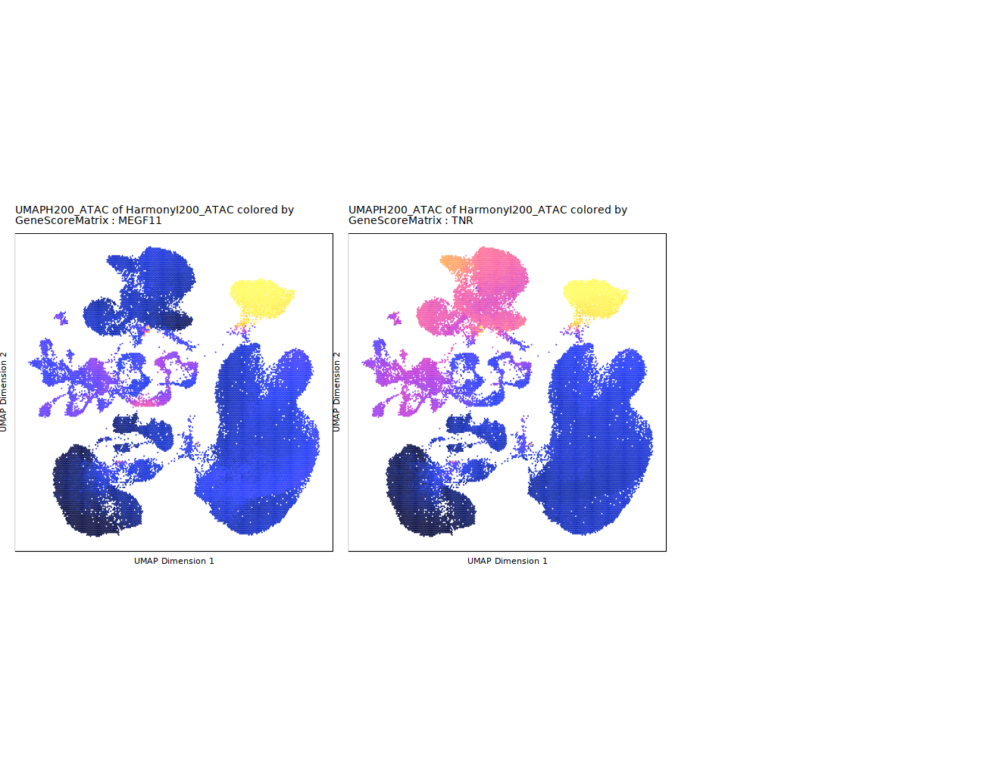

In [34]:
## Neuron vs. Glia markers
markerGenes1  <- c('MEGF11',#OPC
                   'TNR'#OPC
                  )

p <- plotEmbedding( ArchRProj = proj, colorBy = "GeneScoreMatrix", 
                    name = markerGenes1, embedding = "UMAPH200_ATAC")
p <- lapply(p, function(x){
  x + guides(color = FALSE, fill = FALSE) + 
    theme_ArchR(baseSize = 6.5) + theme(plot.margin = unit(c(0, 0, 0, 0), "cm")) +
    theme(  axis.text.x=element_blank(),  axis.ticks.x=element_blank(), 
            axis.text.y=element_blank(),  axis.ticks.y=element_blank())
})
do.call(cowplot::plot_grid, c(list(ncol = 3),p))

Getting ImputeWeights

ArchR logging to : ArchRLogs/ArchR-plotEmbedding-2a7dc2dc0e06a-Date-2022-07-06_Time-16-08-10.log
If there is an issue, please report to github with logFile!

Getting UMAP Embedding

ColorBy = GeneScoreMatrix

Getting Matrix Values...

2022-07-06 16:08:10 : 



Imputing Matrix

Using weights on disk

Using weights on disk

Plotting Embedding

1 
2 


ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-2a7dc2dc0e06a-Date-2022-07-06_Time-16-08-10.log

Warning message:
“`guides(<scale> = FALSE)` is deprecated. Please use `guides(<scale> = "none")` instead.”
Warning message:
“`guides(<scale> = FALSE)` is deprecated. Please use `guides(<scale> = "none")` instead.”


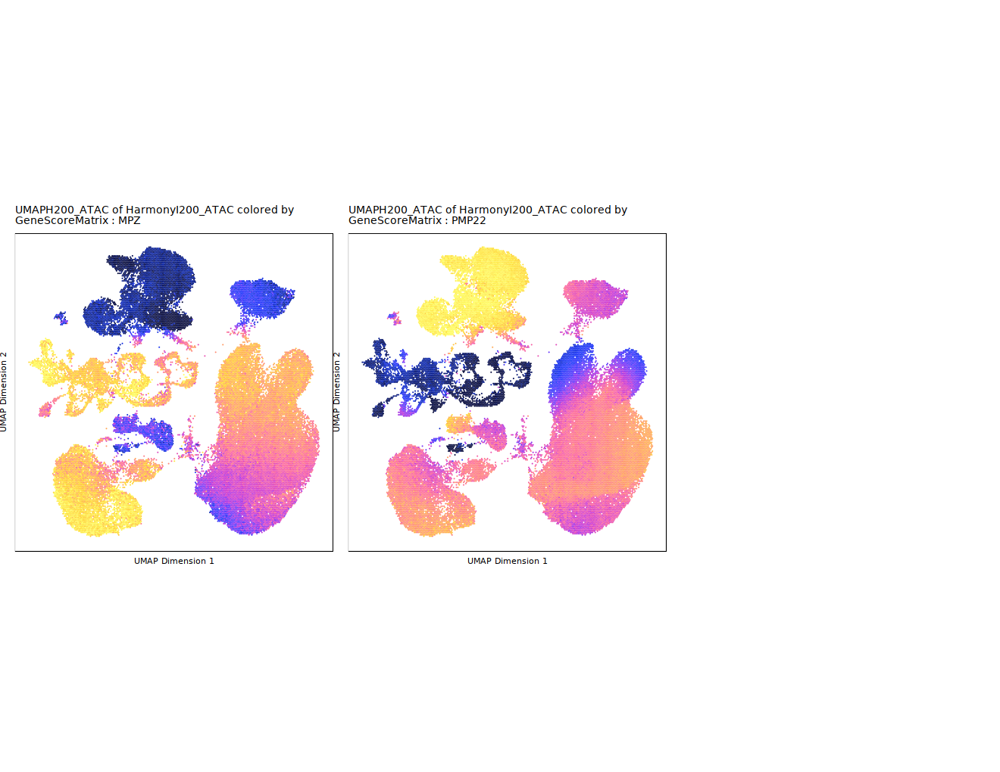

In [35]:
## Neuron vs. Glia markers
markerGenes1  <- c('MPZ',#Schwann
                   'PMP22'#Schwann
                  )

p <- plotEmbedding( ArchRProj = proj, colorBy = "GeneScoreMatrix", 
                    name = markerGenes1, embedding = "UMAPH200_ATAC")
p <- lapply(p, function(x){
  x + guides(color = FALSE, fill = FALSE) + 
    theme_ArchR(baseSize = 6.5) + theme(plot.margin = unit(c(0, 0, 0, 0), "cm")) +
    theme(  axis.text.x=element_blank(),  axis.ticks.x=element_blank(), 
            axis.text.y=element_blank(),  axis.ticks.y=element_blank())
})
do.call(cowplot::plot_grid, c(list(ncol = 3),p))

Getting ImputeWeights

ArchR logging to : ArchRLogs/ArchR-plotEmbedding-2a7dc50dfc10a-Date-2022-07-06_Time-17-16-47.log
If there is an issue, please report to github with logFile!

Getting UMAP Embedding

ColorBy = GeneScoreMatrix

Getting Matrix Values...

2022-07-06 17:17:36 : 



Imputing Matrix

Using weights on disk

Using weights on disk

Plotting Embedding

1 
2 
3 
4 


ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-2a7dc50dfc10a-Date-2022-07-06_Time-17-16-47.log

Warning message:
“`guides(<scale> = FALSE)` is deprecated. Please use `guides(<scale> = "none")` instead.”
Warning message:
“`guides(<scale> = FALSE)` is deprecated. Please use `guides(<scale> = "none")` instead.”
Warning message:
“`guides(<scale> = FALSE)` is deprecated. Please use `guides(<scale> = "none")` instead.”
Warning message:
“`guides(<scale> = FALSE)` is deprecated. Please use `guides(<scale> = "none")` instead.”


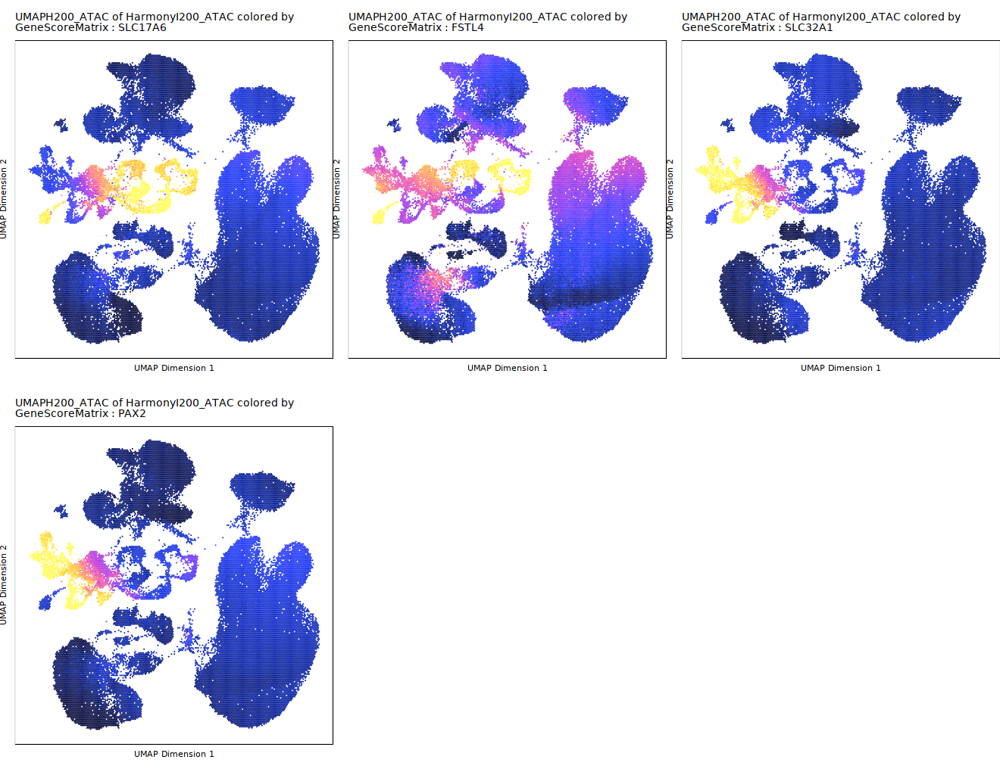

In [37]:
## Excitatory vs. Inhibitory markers
markerGenes1  <- c('SLC17A6','FSTL4', # Excitatory 
                   'SLC32A1','PAX2' # Inhibitory
                  )

p <- plotEmbedding( ArchRProj = proj, colorBy = "GeneScoreMatrix", 
                    name = markerGenes1, embedding = "UMAPH200_ATAC")
p <- lapply(p, function(x){
  x + guides(color = FALSE, fill = FALSE) + 
    theme_ArchR(baseSize = 6.5) + theme(plot.margin = unit(c(0, 0, 0, 0), "cm")) +
    theme(  axis.text.x=element_blank(),  axis.ticks.x=element_blank(), 
            axis.text.y=element_blank(),  axis.ticks.y=element_blank())
})
do.call(cowplot::plot_grid, c(list(ncol = 3),p))

Getting ImputeWeights

ArchR logging to : ArchRLogs/ArchR-plotEmbedding-2a7dc27d85904-Date-2022-07-06_Time-17-40-42.log
If there is an issue, please report to github with logFile!

Getting UMAP Embedding

ColorBy = GeneScoreMatrix

Getting Matrix Values...

2022-07-06 17:40:44 : 



Imputing Matrix

Using weights on disk

Using weights on disk

Plotting Embedding

1 
2 
3 
4 
5 
6 
7 
8 
9 
10 
11 
12 
13 
14 
15 
16 
17 
18 
19 
20 
21 


ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-2a7dc27d85904-Date-2022-07-06_Time-17-40-42.log

Warning message:
“`guides(<scale> = FALSE)` is deprecated. Please use `guides(<scale> = "none")` instead.”
Warning message:
“`guides(<scale> = FALSE)` is deprecated. Please use `guides(<scale> = "none")` instead.”
Warning message:
“`guides(<scale> = FALSE)` is deprecated. Please use `guides(<scale> = "none")` instead.”
Warning message:
“`guides(<scale> = FALSE)` is deprecated. Please use `guides(<scale> = "none")` instead.”
Warning message:
“`

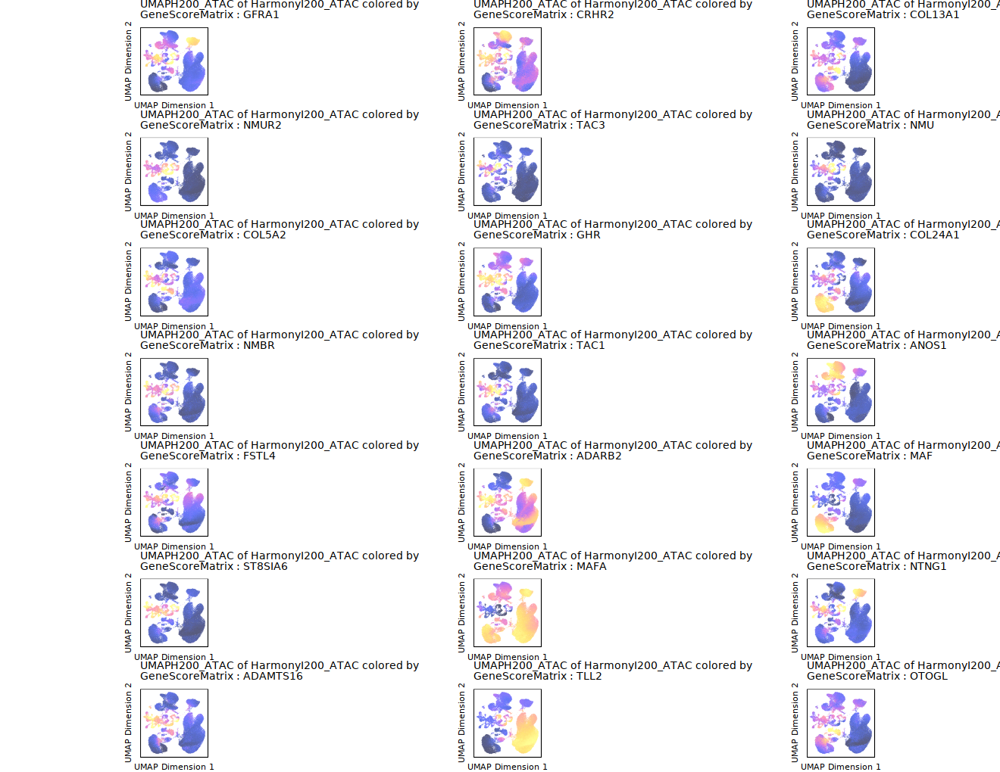

In [39]:
## Marker Genes for differentiation of Excitatory Neurons
markerGenes1  <- c('GFRA1',
                   'CRHR2',
                   'COL13A1',
                   'NMUR2',
                   'TAC3',
                   'NMU',
                   'COL5A2',
                   'GHR',
                   'COL24A1',
                   'NMBR',
                   'TAC1',
                   'ANOS1',
                   'FSTL4',
                   'ADARB2',
                   'MAF',
                   'ST8SIA6',
                   'MAFA',
                   'NTNG1',
                   'ADAMTS16',
                   'TLL2',
                   'OTOGL'
                  )

p <- plotEmbedding( ArchRProj = proj, colorBy = "GeneScoreMatrix", 
                    name = markerGenes1, embedding = "UMAPH200_ATAC")
p <- lapply(p, function(x){
  x + guides(color = FALSE, fill = FALSE) + 
    theme_ArchR(baseSize = 6.5) + theme(plot.margin = unit(c(0, 0, 0, 0), "cm")) +
    theme(  axis.text.x=element_blank(),  axis.ticks.x=element_blank(), 
            axis.text.y=element_blank(),  axis.ticks.y=element_blank())
})
do.call(cowplot::plot_grid, c(list(ncol = 3),p))

Getting ImputeWeights

ArchR logging to : ArchRLogs/ArchR-plotEmbedding-2a7dc552d5c6-Date-2022-07-06_Time-17-54-43.log
If there is an issue, please report to github with logFile!

Getting UMAP Embedding

ColorBy = GeneScoreMatrix

Getting Matrix Values...

2022-07-06 17:54:45 : 



Imputing Matrix

Using weights on disk

Using weights on disk

Plotting Embedding

1 
2 
3 
4 
5 
6 


ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-2a7dc552d5c6-Date-2022-07-06_Time-17-54-43.log

Warning message:
“`guides(<scale> = FALSE)` is deprecated. Please use `guides(<scale> = "none")` instead.”
Warning message:
“`guides(<scale> = FALSE)` is deprecated. Please use `guides(<scale> = "none")` instead.”
Warning message:
“`guides(<scale> = FALSE)` is deprecated. Please use `guides(<scale> = "none")` instead.”
Warning message:
“`guides(<scale> = FALSE)` is deprecated. Please use `guides(<scale> = "none")` instead.”
Warning message:
“`guides(<scale> = FALSE)` is deprecated. Please use `guides(

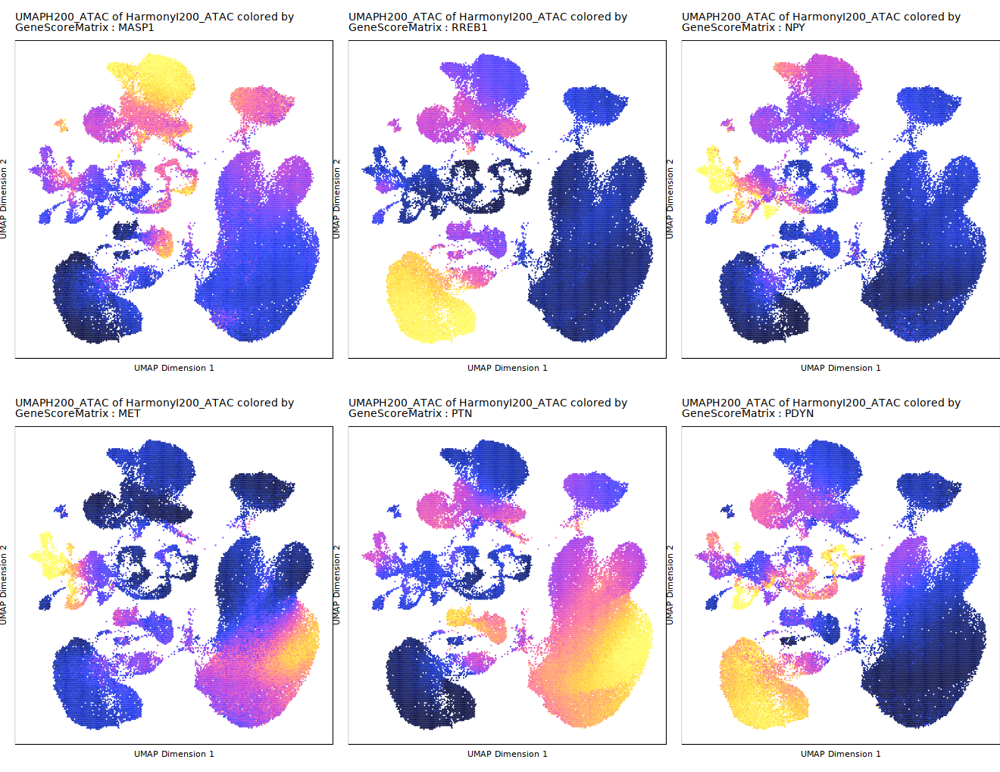

In [41]:
## Marker Genes for differentiation of Inhibitory Nuerons
markerGenes1  <- c('MASP1',
                   'RREB1',
                   'NPY',
                   'MET',
                   'PTN',
                   'PDYN'
                  )

p <- plotEmbedding( ArchRProj = proj, colorBy = "GeneScoreMatrix", 
                    name = markerGenes1, embedding = "UMAPH200_ATAC")
p <- lapply(p, function(x){
  x + guides(color = FALSE, fill = FALSE) + 
    theme_ArchR(baseSize = 6.5) + theme(plot.margin = unit(c(0, 0, 0, 0), "cm")) +
    theme(  axis.text.x=element_blank(),  axis.ticks.x=element_blank(), 
            axis.text.y=element_blank(),  axis.ticks.y=element_blank())
})
do.call(cowplot::plot_grid, c(list(ncol = 3),p))



Getting ImputeWeights

ArchR logging to : ArchRLogs/ArchR-plotEmbedding-2a7dc60fbb862-Date-2022-07-06_Time-17-58-27.log
If there is an issue, please report to github with logFile!

Getting UMAP Embedding

ColorBy = GeneScoreMatrix

Getting Matrix Values...

2022-07-06 17:58:32 : 



Imputing Matrix

Using weights on disk

Using weights on disk

Plotting Embedding

1 
2 
3 
4 
5 
6 
7 
8 


ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-2a7dc60fbb862-Date-2022-07-06_Time-17-58-27.log

Warning message:
“`guides(<scale> = FALSE)` is deprecated. Please use `guides(<scale> = "none")` instead.”
Warning message:
“`guides(<scale> = FALSE)` is deprecated. Please use `guides(<scale> = "none")` instead.”
Warning message:
“`guides(<scale> = FALSE)` is deprecated. Please use `guides(<scale> = "none")` instead.”
Warning message:
“`guides(<scale> = FALSE)` is deprecated. Please use `guides(<scale> = "none")` instead.”
Warning message:
“`guides(<scale> = FALSE)` is deprecated. Please use 

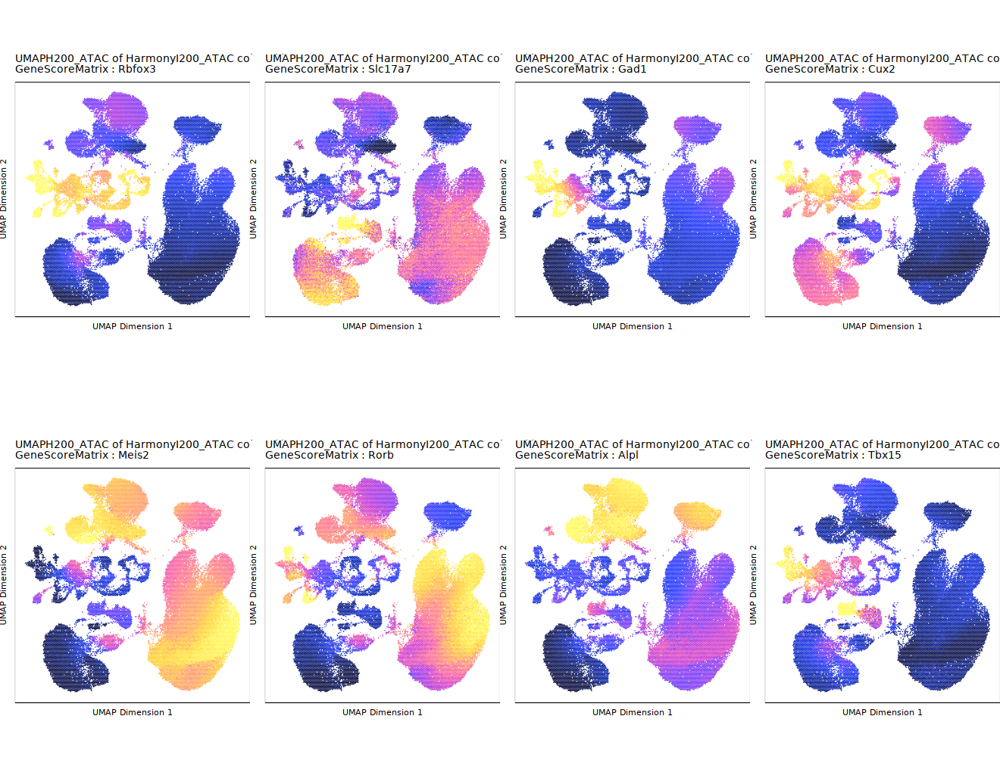

In [42]:
## plot Excitatory neuron markers for major class and upper layers
markerGenes1  <- c(
'Rbfox3', 'Slc17a7', 'Gad1', # Main classes
'Cux2', 'Meis2', "Rorb", # L3/ L4 IT
"Alpl", 'Tbx15') # L4/5)

p <- plotEmbedding( ArchRProj = proj, colorBy = "GeneScoreMatrix", 
                    name = markerGenes1, embedding = "UMAPH200_ATAC")
p <- lapply(p, function(x){
  x + guides(color = FALSE, fill = FALSE) + 
    theme_ArchR(baseSize = 6.5) + theme(plot.margin = unit(c(0, 0, 0, 0), "cm")) +
    theme(  axis.text.x=element_blank(),  axis.ticks.x=element_blank(), 
            axis.text.y=element_blank(),  axis.ticks.y=element_blank())
})
do.call(cowplot::plot_grid, c(list(nrow =2),p))

Getting ImputeWeights

ArchR logging to : ArchRLogs/ArchR-plotEmbedding-2a7dc52940c55-Date-2022-07-06_Time-14-28-10.log
If there is an issue, please report to github with logFile!

Getting UMAP Embedding

ColorBy = GeneScoreMatrix

Getting Matrix Values...

2022-07-06 14:28:11 : 



Imputing Matrix

Using weights on disk

Using weights on disk

Plotting Embedding

1 
2 
3 
4 
5 
6 
7 
8 


ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-2a7dc52940c55-Date-2022-07-06_Time-14-28-10.log

Warning message:
“`guides(<scale> = FALSE)` is deprecated. Please use `guides(<scale> = "none")` instead.”
Warning message:
“`guides(<scale> = FALSE)` is deprecated. Please use `guides(<scale> = "none")` instead.”
Warning message:
“`guides(<scale> = FALSE)` is deprecated. Please use `guides(<scale> = "none")` instead.”
Warning message:
“`guides(<scale> = FALSE)` is deprecated. Please use `guides(<scale> = "none")` instead.”
Warning message:
“`guides(<scale> = FALSE)` is deprecated. Please use 

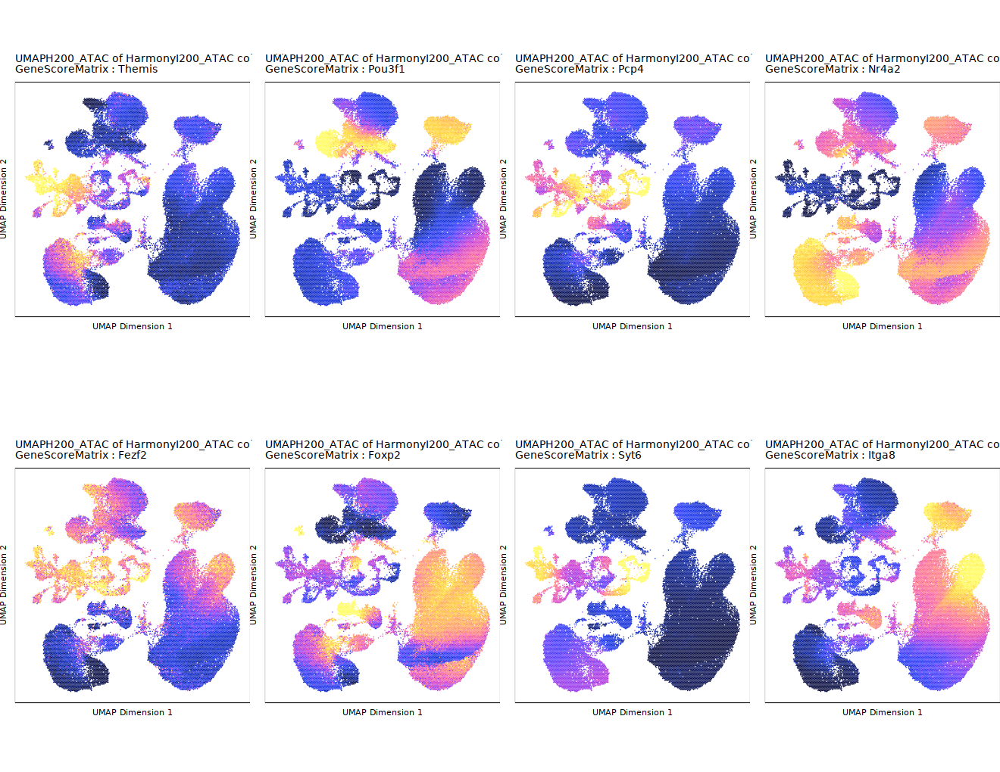

In [20]:
## plot Excitatory neuron markers for deeper layers
markerGenes1  <- c(
'Themis', # Car3 and L6 IT
'Pou3f1', 'Pcp4', 'Nr4a2', # L5
'Fezf2', 'Foxp2',# NP and L6, L5 ET
'Syt6',  'Itga8' #L6
)

p <- plotEmbedding( ArchRProj = proj, colorBy = "GeneScoreMatrix", 
                    name = markerGenes1, embedding = "UMAPH200_ATAC")
p <- lapply(p, function(x){
  x + guides(color = FALSE, fill = FALSE) + 
    theme_ArchR(baseSize = 6.5) + theme(plot.margin = unit(c(0, 0, 0, 0), "cm")) +
    theme(  axis.text.x=element_blank(),  axis.ticks.x=element_blank(), 
            axis.text.y=element_blank(),  axis.ticks.y=element_blank())
})
do.call(cowplot::plot_grid, c(list(nrow = 2),p))

Getting ImputeWeights

ArchR logging to : ArchRLogs/ArchR-plotEmbedding-2a7dc20ddaa34-Date-2022-07-06_Time-14-25-00.log
If there is an issue, please report to github with logFile!

Getting UMAP Embedding

ColorBy = GeneScoreMatrix

Getting Matrix Values...

2022-07-06 14:25:02 : 



Imputing Matrix

Using weights on disk

Using weights on disk

Plotting Embedding

1 
2 
3 
4 
5 
6 
7 
8 


ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-2a7dc20ddaa34-Date-2022-07-06_Time-14-25-00.log

Warning message:
“`guides(<scale> = FALSE)` is deprecated. Please use `guides(<scale> = "none")` instead.”
Warning message:
“`guides(<scale> = FALSE)` is deprecated. Please use `guides(<scale> = "none")` instead.”
Warning message:
“`guides(<scale> = FALSE)` is deprecated. Please use `guides(<scale> = "none")` instead.”
Warning message:
“`guides(<scale> = FALSE)` is deprecated. Please use `guides(<scale> = "none")` instead.”
Warning message:
“`guides(<scale> = FALSE)` is deprecated. Please use 

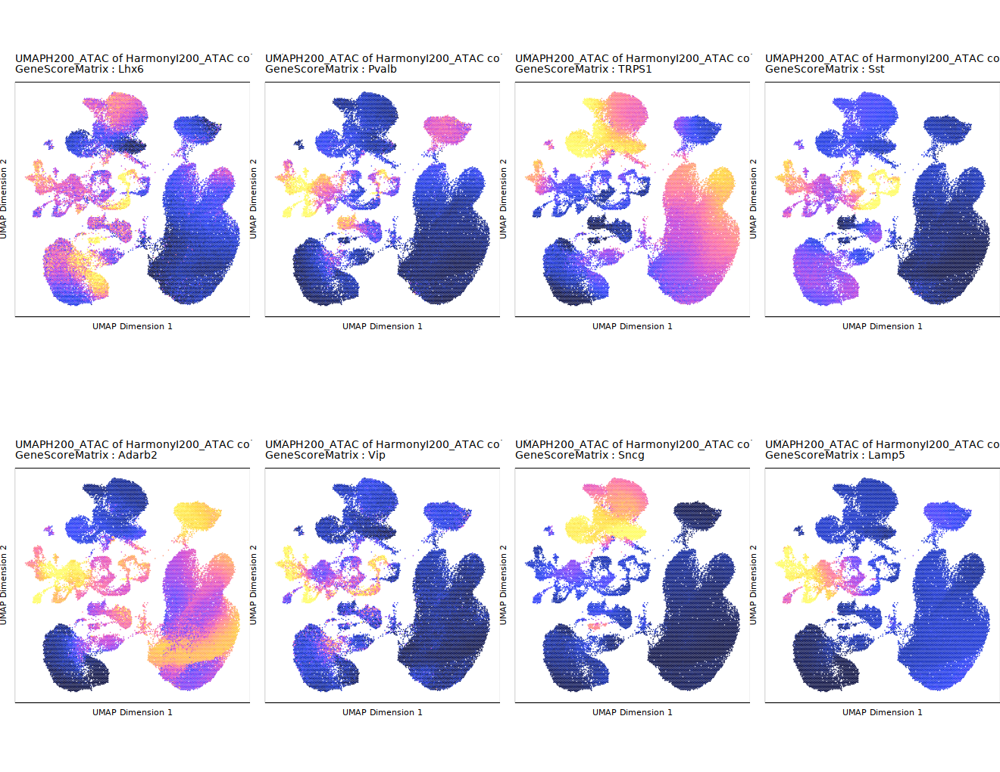

In [19]:
## plot more interneuron markers
markerGenes1  <- c('Lhx6', "Pvalb", 'TRPS1', 'Sst', # MGE markers
                    'Adarb2', 'Vip', 'Sncg', 'Lamp5') # CGE markers

p <- plotEmbedding( ArchRProj = proj, colorBy = "GeneScoreMatrix", 
                    name = markerGenes1, embedding = "UMAPH200_ATAC")
p <- lapply(p, function(x){
  x + guides(color = FALSE, fill = FALSE) + 
    theme_ArchR(baseSize = 6.5) + theme(plot.margin = unit(c(0, 0, 0, 0), "cm")) +
    theme(  axis.text.x=element_blank(),  axis.ticks.x=element_blank(), 
            axis.text.y=element_blank(),  axis.ticks.y=element_blank())
})
do.call(cowplot::plot_grid, c(list(nrow = 2),p))


# Relabel cluster and call peaks

In [45]:
############################################
# using marker gene scores, give cluster names
remapClust <- c(
  'C1'='Drop',
  'C2'='Astro2',
  'C3'='Drop',
  'C4'='Astro1',
  'C5'='Astro1',
  'C6'='OPC',
  'C7'='Drop', 
  'C8'='Drop',
  'C9'='Oligo1',
  'C10'='Oligo2',
  'C11'='EXC',
  'C12'='EXC',
  'C13'='EXC',
  'C14'='EXC',
  'C15'='EXC',
  'C16'='EXC',
  'C17'='INH',
  'C18'='INH',
  'C19'='INH',
  'C20'='INH',
  'C21'='Drop',
  'C22'='Micro',
  'C23'='Ependymal',
  'C24'='Meninges',
  'C25'='Meninges'
)

proj$Celltype1 <- mapLabels(proj$ClustersH200_ATAC, newLabels = remapClust, 
                            oldLabels = names(remapClust))
table(proj$Celltype1)


   Astro1    Astro2      Drop Ependymal       EXC       INH  Meninges     Micro 
     7402      5563      2704       364      3942      4591      2268     10709 
   Oligo1    Oligo2       OPC 
    28727     13509      4002 

ArchR logging to : ArchRLogs/ArchR-plotEmbedding-2a7dc3cbe428e-Date-2022-07-07_Time-13-10-12.log
If there is an issue, please report to github with logFile!

Getting UMAP Embedding

ColorBy = cellColData

Plotting Embedding

1 


ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-2a7dc3cbe428e-Date-2022-07-07_Time-13-10-12.log



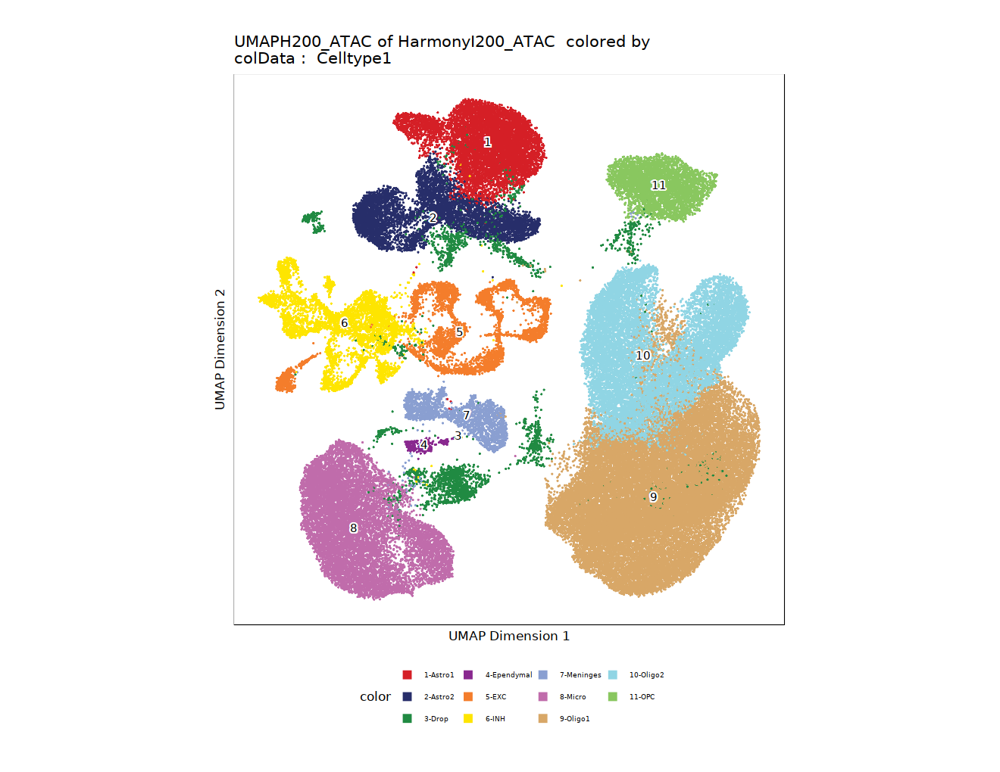

In [46]:
## make UMAP plots
p1 <- plotEmbedding(ArchRProj = proj, colorBy = "cellColData", 
                    name = "Celltype1", embedding = "UMAPH200_ATAC")

p1

In [48]:
# drop the drop clusters, pull out the neuron cell types
ARCHDIR2=file.path(PROJDIR,'Macaque_scATAC_DorsalHorn_neuron')
neuronType = c( 'INH','EXC')
idxSample <- BiocGenerics::which(proj$Celltype1 %in% neuronType )
table(proj$Celltype1[idxSample])
cellsSample <- proj$cellNames[idxSample]

proj2 = subsetArchRProject(
  ArchRProj = proj, cells = cellsSample,
  outputDirectory = ARCHDIR2, force = TRUE
)


 EXC  INH 
3942 4591 

Dropping ImputeWeights Since You Are Subsetting Cells! ImputeWeights is a cell-x-cell Matrix!

Copying ArchRProject to new outputDirectory : /projects/pfenninggroup/singleCell/Macaque_SealDorsalHorn_snATAC-seq/data/tidy_data/ArchRProjects/Macaque_scATAC_DorsalHorn_neuron

Copying Arrow Files...

Getting ImputeWeights

No imputeWeights found, returning NULL

Copying Other Files...

Copying Other Files (1 of 2): Embeddings

Copying Other Files (2 of 2): IterativeLSI200_ATAC

Saving ArchRProject...

Loading ArchRProject...

Successfully loaded ArchRProject!


                                                   / |
                                                 /    \
            .                                  /      |.
            \\\                              /        |.
              \\\                          /           `|.
                \\\                      /              |.
                  \                    /                |\
                  \\#####\         

In [49]:
# drop the drop clusters, pull out the glia cell types
ARCHDIR2=file.path(PROJDIR,'Macaque_scATAC_DorsalHorn_glia')
idxSample <- BiocGenerics::which(proj$Celltype1 %ni% c(neuronType, 'Drop'))
table(proj$Celltype1[idxSample])
cellsSample <- proj$cellNames[idxSample]

proj2 = subsetArchRProject(
  ArchRProj = proj,
  cells = cellsSample,
  outputDirectory = ARCHDIR2, force = TRUE
)


   Astro1    Astro2 Ependymal  Meninges     Micro    Oligo1    Oligo2       OPC 
     7402      5563       364      2268     10709     28727     13509      4002 

Dropping ImputeWeights Since You Are Subsetting Cells! ImputeWeights is a cell-x-cell Matrix!

Copying ArchRProject to new outputDirectory : /projects/pfenninggroup/singleCell/Macaque_SealDorsalHorn_snATAC-seq/data/tidy_data/ArchRProjects/Macaque_scATAC_DorsalHorn_glia

Copying Arrow Files...

Getting ImputeWeights

No imputeWeights found, returning NULL

Copying Other Files...

Copying Other Files (1 of 2): Embeddings

Copying Other Files (2 of 2): IterativeLSI200_ATAC

Saving ArchRProject...

Loading ArchRProject...

Successfully loaded ArchRProject!


                                                   / |
                                                 /    \
            .                                  /      |.
            \\\                              /        |.
              \\\                          /           `|.
                \\\                      /              |.
                  \                    /                |\
                  \\#####\           

In [50]:
proj = saveArchRProject(ArchRProj = proj)

Saving ArchRProject...

Loading ArchRProject...

Successfully loaded ArchRProject!


                                                   / |
                                                 /    \
            .                                  /      |.
            \\\                              /        |.
              \\\                          /           `|.
                \\\                      /              |.
                  \                    /                |\
                  \\#####\           /                  ||
                ==###########>      /                   ||
                 \\##==......\    /                     ||
            ______ =       =|__ /__                     ||      \\\
        ,--' ,----`-,__ ___/'  --,-`-===================##========>
       \               '        ##_______ _____ ,--,__,=##,__   ///
        ,    __==    ___,-,__,--'#'  ==='      `-'    | ##,-/
        -,____,---'       \\####\\________________,--\\_##,/
         